In [1]:
car_df = pd.read_csv(r'C:\Users\Administrator\Class Notebooks\Datasets\Linear Regression\carprice.csv')

In [2]:
car_df.head()

,Brand,Price,Body,Mileage,EngineV,Engine Type,Registration,Year,Model
0,BMW,4200.0,sedan,277,2.0,Petrol,yes,1991,320
1,Mercedes-Benz,7900.0,van,427,2.9,Diesel,yes,1999,Sprinter 212
2,Mercedes-Benz,13300.0,sedan,358,5.0,Gas,yes,2003,S 500
3,Audi,23000.0,crossover,240,4.2,Petrol,yes,2007,Q7
4,Toyota,18300.0,crossover,120,2.0,Petrol,yes,2011,Rav 4


In [3]:
car_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4345 entries, 0 to 4344
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Brand         4345 non-null   object 
 1   Price         4173 non-null   float64
 2   Body          4345 non-null   object 
 3   Mileage       4345 non-null   int64  
 4   EngineV       4195 non-null   float64
 5   Engine Type   4345 non-null   object 
 6   Registration  4345 non-null   object 
 7   Year          4345 non-null   int64  
 8   Model         4345 non-null   object 
dtypes: float64(2), int64(2), object(5)
memory usage: 305.6+ KB


In [4]:
# Exploring descriptive statistics
car_df.describe().T


,count,mean,std,min,25%,50%,75%,max
Price,4173.0,19418.746935,25584.242620,600.0,6999.0,11500.0,21700.0,300000.00
Mileage,4345.0,161.237284,105.705797,0.0,86.0,155.0,230.0,980.00
EngineV,4195.0,2.790734,5.066437,0.6,1.8,2.2,3.0,99.99
Year,4345.0,2006.550058,6.719097,1969.0,2003.0,2008.0,2012.0,2016.00


In [5]:
car_df.describe(include = 'O').T

,count,unique,top,freq
Brand,4345,7,Volkswagen,936
Body,4345,6,sedan,1649
Engine Type,4345,4,Diesel,2019
Registration,4345,2,yes,3947
Model,4345,312,E-Class,199


In [7]:
car_df['Brand'].value_counts()

Volkswagen       936
Mercedes-Benz    921
BMW              694
Toyota           541
Renault          469
Audi             457
Mitsubishi       327
Name: Brand, dtype: int64

In [8]:
car_df['Body'].value_counts()

sedan        1649
crossover     901
van           675
other         433
vagon         402
hatch         285
Name: Body, dtype: int64

In [9]:
car_df['Engine Type'].value_counts()

Diesel    2019
Petrol    1559
Gas        613
Other      154
Name: Engine Type, dtype: int64

In [13]:
car_df[['Body','Brand']]

,Body,Brand
0,sedan,BMW
1,van,Mercedes-Benz
2,sedan,Mercedes-Benz
3,crossover,Audi
4,crossover,Toyota
5,crossover,Mercedes-Benz
6,sedan,BMW
7,vagon,Audi
8,vagon,Renault
9,other,Volkswagen


In [12]:
pd.set_option('display.max_rows',None)
car_df[['Body','Brand']].groupby(['Brand','Body']).size()

Brand          Body     
Audi           crossover     77
               hatch         19
               other         35
               sedan        217
               vagon        108
               van            1
BMW            crossover    191
               hatch         12
               other         60
               sedan        389
               vagon         42
Mercedes-Benz  crossover    168
               hatch         23
               other        141
               sedan        385
               vagon         22
               van          182
Mitsubishi     crossover    137
               hatch         19
               other         26
               sedan        129
               vagon          8
               van            8
Renault        crossover     19
               hatch         41
               other         35
               sedan         59
               vagon        112
               van          203
Toyota         crossover    223
               

<AxesSubplot:xlabel='Brand', ylabel='count'>

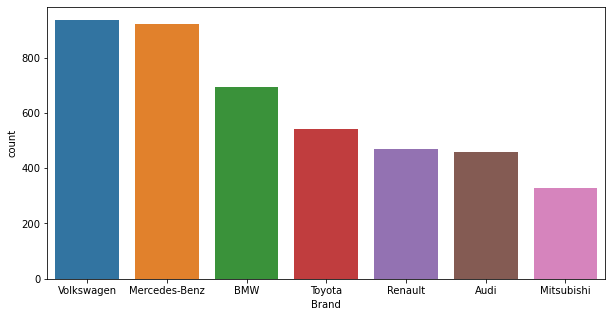

In [16]:
plt.figure(figsize = (10,5))
sns.countplot(x = 'Brand',data = car_df,order = car_df['Brand'].value_counts().index )

In [18]:
car_df.isnull().sum()

Brand             0
Price           172
Body              0
Mileage           0
EngineV         150
Engine Type       0
Registration      0
Year              0
Model             0
dtype: int64

In [19]:
car_df_rmv = car_df.copy()

In [21]:
car_df_rmv.isnull().sum()

Brand             0
Price           172
Body              0
Mileage           0
EngineV         150
Engine Type       0
Registration      0
Year              0
Model             0
dtype: int64

In [22]:
car_df_rmv.dropna(axis = 0, inplace=True)

In [23]:
car_df_rmv.isnull().sum()

Brand           0
Price           0
Body            0
Mileage         0
EngineV         0
Engine Type     0
Registration    0
Year            0
Model           0
dtype: int64

In [35]:
car_df.columns

Index(['Brand', 'Price', 'Body', 'Mileage', 'EngineV', 'Engine Type',
       'Registration', 'Year', 'Model'],
      dtype='object')

In [24]:
car_df_missing = car_df.copy()

In [25]:
from sklearn.impute import SimpleImputer

In [26]:
car_df_missing.head()

,Brand,Price,Body,Mileage,EngineV,Engine Type,Registration,Year,Model
0,BMW,4200.0,sedan,277,2.0,Petrol,yes,1991,320
1,Mercedes-Benz,7900.0,van,427,2.9,Diesel,yes,1999,Sprinter 212
2,Mercedes-Benz,13300.0,sedan,358,5.0,Gas,yes,2003,S 500
3,Audi,23000.0,crossover,240,4.2,Petrol,yes,2007,Q7
4,Toyota,18300.0,crossover,120,2.0,Petrol,yes,2011,Rav 4


In [31]:
car_df_missing = car_df_missing.values

In [32]:
car_df_missing[:,4:5]

array([[2.0],
       [2.9],
       [5.0],
       ...,
       [2.0],
       [nan],
       [2.0]], dtype=object)

In [33]:
impute1 = SimpleImputer(missing_values=np.nan,strategy='mean' )
impute1.fit(car_df_missing[:,4:5])
car_df_missing[:,4:5] = impute1.transform(car_df_missing[:,4:5])

In [39]:
df_car_tran = pd.DataFrame(car_df_missing, columns=['Brand', 'Price', 'Body', 'Mileage', 'EngineV', 'Engine Type',
       'Registration', 'Year', 'Model']).convert_dtypes()

In [40]:
df_car_tran.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4345 entries, 0 to 4344
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Brand         4345 non-null   string 
 1   Price         4173 non-null   float64
 2   Body          4345 non-null   string 
 3   Mileage       4345 non-null   Int64  
 4   EngineV       4345 non-null   float64
 5   Engine Type   4345 non-null   string 
 6   Registration  4345 non-null   string 
 7   Year          4345 non-null   Int64  
 8   Model         4345 non-null   string 
dtypes: Int64(2), float64(2), string(5)
memory usage: 314.1 KB


In [42]:
df_car_tran.describe().T

,count,mean,std,min,25%,50%,75%,max
Price,4173.0,19418.746935,25584.242620,600.0,6999.0,11500.0,21700.0,300000.00
Mileage,4345.0,161.237284,105.705797,0.0,86.0,155.0,230.0,980.00
EngineV,4345.0,2.790734,4.978196,0.6,1.9,2.2,3.0,99.99
Year,4345.0,2006.550058,6.719097,1969.0,2003.0,2008.0,2012.0,2016.00


In [44]:
car_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Price,4173.0,19418.746935,25584.242620,600.0,6999.0,11500.0,21700.0,300000.00
Mileage,4345.0,161.237284,105.705797,0.0,86.0,155.0,230.0,980.00
EngineV,4195.0,2.790734,5.066437,0.6,1.8,2.2,3.0,99.99
Year,4345.0,2006.550058,6.719097,1969.0,2003.0,2008.0,2012.0,2016.00


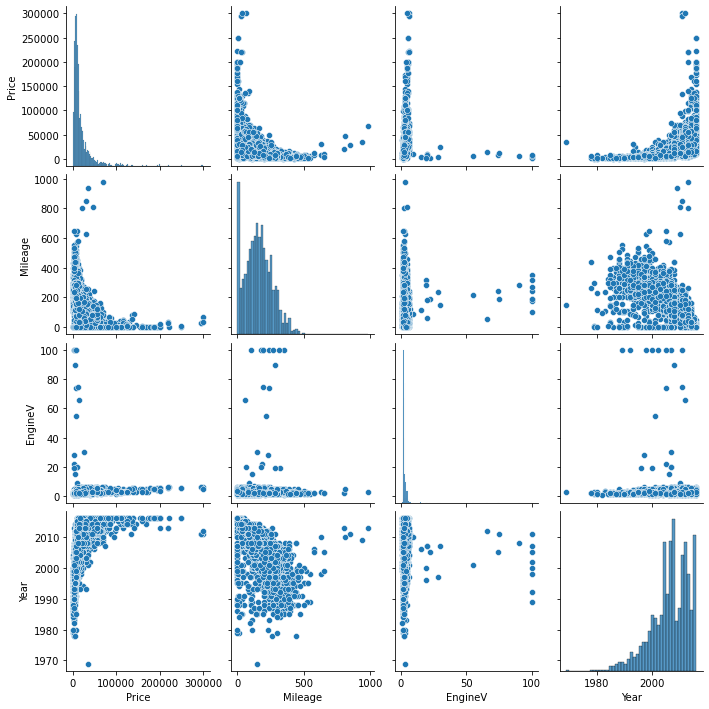

In [45]:
sns.pairplot(data = car_df)

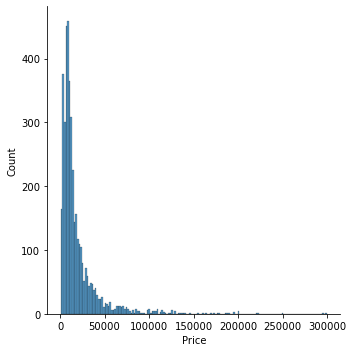

In [46]:
sns.displot(car_df['Price'])

In [47]:
# One way to deal with the outliers is to remove the top 1% of observations
# Want to get only 99 percentile values

In [48]:
q = car_df['Price'].quantile(0.99)

In [49]:
q

126902.15999999919

In [52]:
car_data_u = car_df[car_df['Price']<q]

In [53]:
car_data_u

,Brand,Price,Body,Mileage,EngineV,Engine Type,Registration,Year,Model
0,BMW,4200.00,sedan,277,2.00,Petrol,yes,1991,320
1,Mercedes-Benz,7900.00,van,427,2.90,Diesel,yes,1999,Sprinter 212
2,Mercedes-Benz,13300.00,sedan,358,5.00,Gas,yes,2003,S 500
3,Audi,23000.00,crossover,240,4.20,Petrol,yes,2007,Q7
4,Toyota,18300.00,crossover,120,2.00,Petrol,yes,2011,Rav 4
6,BMW,6100.00,sedan,438,2.00,Gas,yes,1997,320
7,Audi,14200.00,vagon,200,2.70,Diesel,yes,2006,A6
8,Renault,10799.00,vagon,193,1.50,Diesel,yes,2012,Megane
9,Volkswagen,1400.00,other,212,1.80,Gas,no,1999,Golf IV
10,Renault,11950.00,vagon,177,1.50,Diesel,yes,2011,Megane


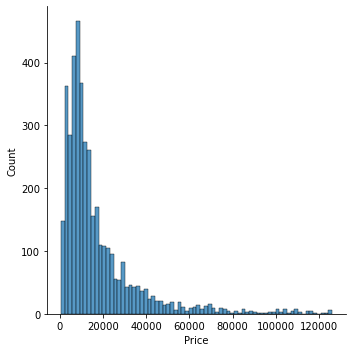

In [54]:
sns.displot(car_data_u['Price'])

In [75]:
q = car_data_u['Mileage'].quantile(0.99)


In [76]:
q

440.0

In [77]:
car_data_u['Mileage']<q

0        True
1        True
2        True
3        True
4        True
6        True
7        True
8        True
9        True
10       True
11       True
12       True
13       True
14       True
15       True
16       True
18       True
19       True
20       True
21       True
22       True
23       True
24       True
25       True
26       True
27       True
28       True
30       True
31       True
32       True
33       True
34       True
35       True
36       True
37       True
38       True
39       True
40       True
41       True
42       True
43       True
44       True
45       True
46       True
47       True
48       True
49       True
51       True
52       True
53       True
54       True
56       True
57       True
58       True
59       True
60       True
61       True
63       True
64       True
65       True
66       True
67       True
68       True
69       True
70       True
71       True
72       True
73       True
74       True
75       True
76       True
77    

In [78]:
car_data_u[car_data_u['Mileage']<q]

,Brand,Price,Body,Mileage,EngineV,Engine Type,Registration,Year,Model
0,BMW,4200.00,sedan,277,2.00,Petrol,yes,1991,320
1,Mercedes-Benz,7900.00,van,427,2.90,Diesel,yes,1999,Sprinter 212
2,Mercedes-Benz,13300.00,sedan,358,5.00,Gas,yes,2003,S 500
3,Audi,23000.00,crossover,240,4.20,Petrol,yes,2007,Q7
4,Toyota,18300.00,crossover,120,2.00,Petrol,yes,2011,Rav 4
6,BMW,6100.00,sedan,438,2.00,Gas,yes,1997,320
7,Audi,14200.00,vagon,200,2.70,Diesel,yes,2006,A6
8,Renault,10799.00,vagon,193,1.50,Diesel,yes,2012,Megane
9,Volkswagen,1400.00,other,212,1.80,Gas,no,1999,Golf IV
10,Renault,11950.00,vagon,177,1.50,Diesel,yes,2011,Megane


In [ ]:
car_data_u2 = car_data_u[car_data_u['Mileage']<q]

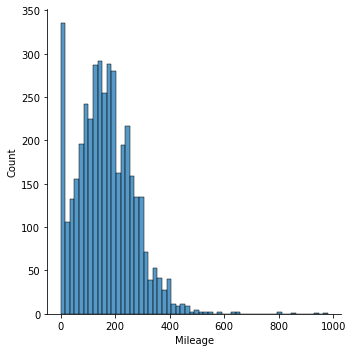

In [57]:
sns.displot(car_data_u['Mileage'])

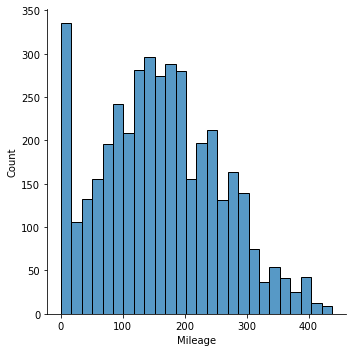

In [58]:
sns.displot(car_data_u2['Mileage'])

In [74]:
# Impute null for price
# Find out other ways to deal with outliers 
# Detal with outliers - Year & EngineV

In [80]:
# car_data_u3 = car_data_u2[car_data_u2['EngineV']<6.5]

In [94]:
car_data_u2['EngineV'].describe()

count    3944.000000
mean        2.746851
std         4.980291
min         0.600000
25%         1.800000
50%         2.200000
75%         3.000000
max        99.990000
Name: EngineV, dtype: float64

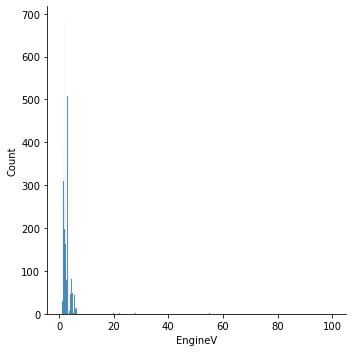

In [92]:
sns.displot(car_data_u2['EngineV'])

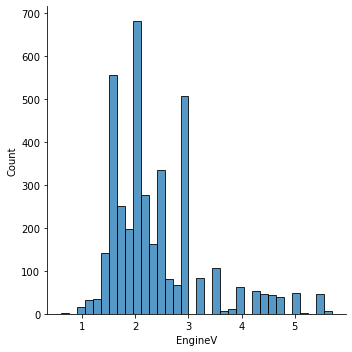

In [93]:
sns.displot(car_data_u3['EngineV'])

In [83]:
ev = car_data_u2['EngineV'].quantile(0.99)

In [86]:
car_data_u3 = car_data_u2[car_data_u2['EngineV']<ev]

In [87]:
car_data_u3

,Brand,Price,Body,Mileage,EngineV,Engine Type,Registration,Year,Model,log_price
0,BMW,4200.00,sedan,277,2.00,Petrol,yes,1991,320,8.342840
1,Mercedes-Benz,7900.00,van,427,2.90,Diesel,yes,1999,Sprinter 212,8.974618
2,Mercedes-Benz,13300.00,sedan,358,5.00,Gas,yes,2003,S 500,9.495519
3,Audi,23000.00,crossover,240,4.20,Petrol,yes,2007,Q7,10.043249
4,Toyota,18300.00,crossover,120,2.00,Petrol,yes,2011,Rav 4,9.814656
6,BMW,6100.00,sedan,438,2.00,Gas,yes,1997,320,8.716044
7,Audi,14200.00,vagon,200,2.70,Diesel,yes,2006,A6,9.560997
8,Renault,10799.00,vagon,193,1.50,Diesel,yes,2012,Megane,9.287209
9,Volkswagen,1400.00,other,212,1.80,Gas,no,1999,Golf IV,7.244228
10,Renault,11950.00,vagon,177,1.50,Diesel,yes,2011,Megane,9.388487


# Assumptions

Text(0.5, 1.0, 'EngineV & Price')

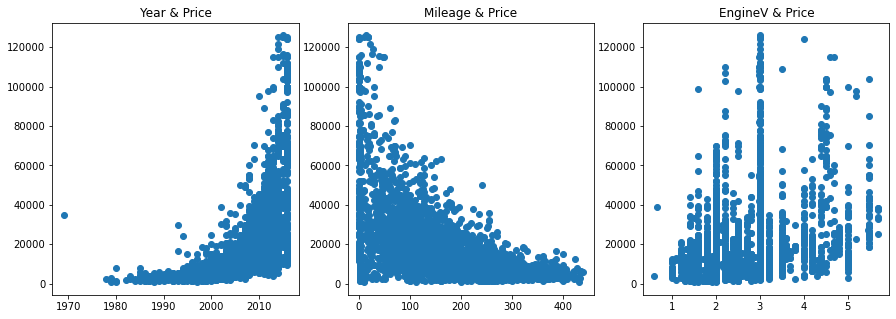

In [88]:
f,(ax1, ax2,ax3) = plt.subplots(1,3,figsize = (15,5))
ax1.scatter(car_data_u3['Year'],car_data_u3['Price'])
ax1.set_title('Year & Price')
ax2.scatter(car_data_u3['Mileage'],car_data_u3['Price'])
ax2.set_title('Mileage & Price')
ax3.scatter(car_data_u3['EngineV'],car_data_u3['Price'])
ax3.set_title('EngineV & Price')

In [89]:
log_price = np.log(car_data_u3['Price'])

In [90]:
log_price

0        8.342840
1        8.974618
2        9.495519
3       10.043249
4        9.814656
6        8.716044
7        9.560997
8        9.287209
9        7.244228
10       9.388487
11       7.824046
12       9.159047
13       9.259131
14       9.680344
15       9.059517
16       8.003029
18      10.184900
19       8.160518
20      10.551454
21       8.922658
22       8.824678
23       9.259131
24      10.122623
25       9.942708
26       8.779557
27       9.515322
28       9.047821
30       7.972466
31       9.975808
32       9.792556
33      10.257659
34       9.190138
35       9.581904
36       8.699515
37      11.119883
38      10.431170
40       9.190138
41      11.050890
42       8.948976
43       9.169518
44       9.457200
45      10.621327
46       7.824046
47       8.216088
48      10.292146
49       8.779557
51       9.017968
52       9.878170
53       9.510445
54       9.126959
57       8.517193
58      10.081634
59      10.515967
60       9.093807
61       8.961879
63       7

In [95]:
car_data_u3['log_price'] = log_price

<ipython-input-95-0dd4c6dd30b3>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  car_data_u3['log_price'] = log_price


In [96]:
car_data_u3

,Brand,Price,Body,Mileage,EngineV,Engine Type,Registration,Year,Model,log_price
0,BMW,4200.00,sedan,277,2.00,Petrol,yes,1991,320,8.342840
1,Mercedes-Benz,7900.00,van,427,2.90,Diesel,yes,1999,Sprinter 212,8.974618
2,Mercedes-Benz,13300.00,sedan,358,5.00,Gas,yes,2003,S 500,9.495519
3,Audi,23000.00,crossover,240,4.20,Petrol,yes,2007,Q7,10.043249
4,Toyota,18300.00,crossover,120,2.00,Petrol,yes,2011,Rav 4,9.814656
6,BMW,6100.00,sedan,438,2.00,Gas,yes,1997,320,8.716044
7,Audi,14200.00,vagon,200,2.70,Diesel,yes,2006,A6,9.560997
8,Renault,10799.00,vagon,193,1.50,Diesel,yes,2012,Megane,9.287209
9,Volkswagen,1400.00,other,212,1.80,Gas,no,1999,Golf IV,7.244228
10,Renault,11950.00,vagon,177,1.50,Diesel,yes,2011,Megane,9.388487


Text(0.5, 1.0, 'EngineV & Price')

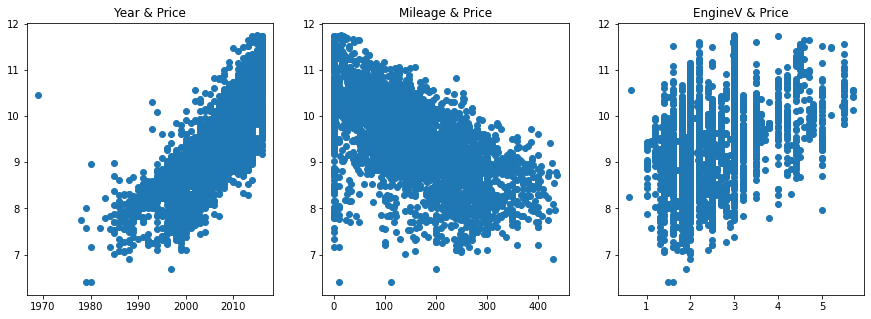

In [97]:
f,(ax1, ax2,ax3) = plt.subplots(1,3,figsize = (15,5))
ax1.scatter(car_data_u3['Year'],car_data_u3['log_price'])
ax1.set_title('Year & Price')
ax2.scatter(car_data_u3['Mileage'],car_data_u3['log_price'])
ax2.set_title('Mileage & Price')
ax3.scatter(car_data_u3['EngineV'],car_data_u3['log_price'])
ax3.set_title('EngineV & Price')

In [98]:
car_data_u3.head()

,Brand,Price,Body,Mileage,EngineV,Engine Type,Registration,Year,Model,log_price
0,BMW,4200.0,sedan,277,2.0,Petrol,yes,1991,320,8.342840
1,Mercedes-Benz,7900.0,van,427,2.9,Diesel,yes,1999,Sprinter 212,8.974618
2,Mercedes-Benz,13300.0,sedan,358,5.0,Gas,yes,2003,S 500,9.495519
3,Audi,23000.0,crossover,240,4.2,Petrol,yes,2007,Q7,10.043249
4,Toyota,18300.0,crossover,120,2.0,Petrol,yes,2011,Rav 4,9.814656


In [100]:
car_data_u3.describe(include='O').T

,count,unique,top,freq
Brand,3894,7,Volkswagen,862
Body,3894,6,sedan,1483
Engine Type,3894,4,Diesel,1817
Registration,3894,2,yes,3532
Model,3894,293,E-Class,185


In [101]:
car_data_u3 = car_data_u3.drop(['Model'],axis = 1)

In [102]:
car_data_u3.head()

,Brand,Price,Body,Mileage,EngineV,Engine Type,Registration,Year,log_price
0,BMW,4200.0,sedan,277,2.0,Petrol,yes,1991,8.342840
1,Mercedes-Benz,7900.0,van,427,2.9,Diesel,yes,1999,8.974618
2,Mercedes-Benz,13300.0,sedan,358,5.0,Gas,yes,2003,9.495519
3,Audi,23000.0,crossover,240,4.2,Petrol,yes,2007,10.043249
4,Toyota,18300.0,crossover,120,2.0,Petrol,yes,2011,9.814656


In [103]:
# Correlation Matrix
car_data_u3.corr()

,Price,Mileage,EngineV,Year,log_price
Price,1.000000,-0.549173,0.384519,0.558878,0.850128
Mileage,-0.549173,1.000000,0.017025,-0.672588,-0.601098
EngineV,0.384519,0.017025,1.000000,-0.001931,0.406069
Year,0.558878,-0.672588,-0.001931,1.000000,0.751855
log_price,0.850128,-0.601098,0.406069,0.751855,1.000000


<AxesSubplot:>

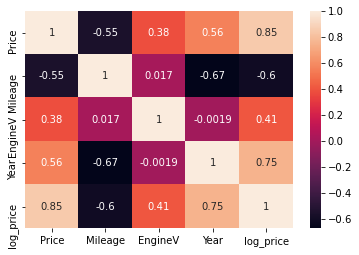

In [104]:
sns.heatmap(car_data_u3.corr(), annot=True)

In [105]:
# VIF - Variance Inflation Factor
# 1 - Ok
# 1-5 - Aboslutely fine
# 5-7 > We need to get rid of those Variables

In [109]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
variable = car_data_u3[['Mileage','Year','EngineV']]
vif = pd.DataFrame()
vif['VIF'] = [variance_inflation_factor(variable.values, i) for i in range(variable.shape[1])]
vif['Features']= variable.columns

In [110]:
vif

,VIF,Features
0,3.797445,Mileage
1,10.869909,Year
2,8.280873,EngineV


In [112]:
#variable

In [115]:
variable.shape[1]

3

In [116]:
variable.values

array([[2.770e+02, 1.991e+03, 2.000e+00],
       [4.270e+02, 1.999e+03, 2.900e+00],
       [3.580e+02, 2.003e+03, 5.000e+00],
       ...,
       [1.000e+00, 1.999e+03, 3.500e+00],
       [1.940e+02, 1.985e+03, 2.000e+00],
       [1.240e+02, 2.013e+03, 2.000e+00]])

In [117]:
variance_inflation_factor(variable.values,0)

3.7974454320054196

In [118]:
variance_inflation_factor(variable.values,1)

10.869908910024932

In [120]:
variance_inflation_factor(variable.values,2)

8.280872881617153

In [122]:
car_data_u4 = car_data_u3.drop(['Year'],axis = 1)

In [123]:
car_data_u4

,Brand,Price,Body,Mileage,EngineV,Engine Type,Registration,log_price
0,BMW,4200.00,sedan,277,2.00,Petrol,yes,8.342840
1,Mercedes-Benz,7900.00,van,427,2.90,Diesel,yes,8.974618
2,Mercedes-Benz,13300.00,sedan,358,5.00,Gas,yes,9.495519
3,Audi,23000.00,crossover,240,4.20,Petrol,yes,10.043249
4,Toyota,18300.00,crossover,120,2.00,Petrol,yes,9.814656
6,BMW,6100.00,sedan,438,2.00,Gas,yes,8.716044
7,Audi,14200.00,vagon,200,2.70,Diesel,yes,9.560997
8,Renault,10799.00,vagon,193,1.50,Diesel,yes,9.287209
9,Volkswagen,1400.00,other,212,1.80,Gas,no,7.244228
10,Renault,11950.00,vagon,177,1.50,Diesel,yes,9.388487


In [124]:
car_data_u4_dum = pd.get_dummies(car_data_u4,drop_first=True)

In [125]:
car_data_u4_dum.head(2)

,Price,Mileage,EngineV,log_price,Brand_BMW,Brand_Mercedes-Benz,Brand_Mitsubishi,Brand_Renault,Brand_Toyota,Brand_Volkswagen,Body_hatch,Body_other,Body_sedan,Body_vagon,Body_van,Engine Type_Gas,Engine Type_Other,Engine Type_Petrol,Registration_yes
0,4200.0,277,2.0,8.342840,1,0,0,0,0,0,0,0,1,0,0,0,0,1,1
1,7900.0,427,2.9,8.974618,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1


In [126]:
car_data_u3['Body'].unique()

array(['sedan', 'van', 'crossover', 'vagon', 'other', 'hatch'],
      dtype=object)

In [127]:
car_data_u4_dum.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3894 entries, 0 to 4344
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Price                3894 non-null   float64
 1   Mileage              3894 non-null   int64  
 2   EngineV              3894 non-null   float64
 3   log_price            3894 non-null   float64
 4   Brand_BMW            3894 non-null   uint8  
 5   Brand_Mercedes-Benz  3894 non-null   uint8  
 6   Brand_Mitsubishi     3894 non-null   uint8  
 7   Brand_Renault        3894 non-null   uint8  
 8   Brand_Toyota         3894 non-null   uint8  
 9   Brand_Volkswagen     3894 non-null   uint8  
 10  Body_hatch           3894 non-null   uint8  
 11  Body_other           3894 non-null   uint8  
 12  Body_sedan           3894 non-null   uint8  
 13  Body_vagon           3894 non-null   uint8  
 14  Body_van             3894 non-null   uint8  
 15  Engine Type_Gas      3894 non-null   u

In [128]:
car_data_u4_dum.drop(['Price'],axis = 1, inplace=True)

In [129]:
car_data_u4_dum.head(1)

,Mileage,EngineV,log_price,Brand_BMW,Brand_Mercedes-Benz,Brand_Mitsubishi,Brand_Renault,Brand_Toyota,Brand_Volkswagen,Body_hatch,Body_other,Body_sedan,Body_vagon,Body_van,Engine Type_Gas,Engine Type_Other,Engine Type_Petrol,Registration_yes
0,277,2.0,8.34284,1,0,0,0,0,0,0,0,1,0,0,0,0,1,1


In [130]:
targets = car_data_u4_dum['log_price']
inputs = car_data_u4_dum.drop(['log_price'], axis = 1)

In [131]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(inputs)

StandardScaler()

In [134]:
input_scaled = scaler.transform(inputs)

In [135]:
input_scaled 

array([[ 1.19804094, -0.46534139,  2.2804905 , ..., -0.16318088,
         1.33992746,  0.32014295],
       [ 2.75677323,  0.53920783, -0.43850215, ..., -0.16318088,
        -0.74630906,  0.32014295],
       [ 2.03975638,  2.88315599, -0.43850215, ..., -0.16318088,
        -0.74630906,  0.32014295],
       ...,
       [-1.67002647,  1.2089073 ,  2.2804905 , ..., -0.16318088,
         1.33992746,  0.32014295],
       [ 0.33554241, -0.46534139,  2.2804905 , ..., -0.16318088,
         1.33992746,  0.32014295],
       [-0.39186599, -0.46534139, -0.43850215, ..., -0.16318088,
        -0.74630906,  0.32014295]])

In [136]:
# Scale data before creating a dummy variables 

In [137]:
from sklearn.model_selection import train_test_split

In [138]:
X_train,X_test, y_train,y_test = train_test_split(input_scaled, targets, test_size = 0.2, random_state = 1)

In [139]:
X_train.shape,X_test.shape

((3115, 17), (779, 17))

In [140]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

In [141]:
lm = LinearRegression()
lm.fit(X_train, y_train)

LinearRegression()

In [143]:
y_hat = lm.predict(X_train)

In [144]:
y_hat

array([ 9.79464815, 10.09359781,  9.7707287 , ...,  8.66256349,
        9.56813741,  9.70592372])

In [145]:
exp_train_pred = np.exp(y_hat)

In [148]:
exp_train_act = np.exp(y_train.reset_index(drop = True))

In [149]:
exp_train_act

0        18800.00
1        11000.00
2        44000.00
3        15500.00
4        17900.00
5        10200.00
6         2700.00
7        25500.00
8         3000.00
9         8800.00
10       11800.00
11        8400.00
12        5300.00
13       18400.00
14        4600.00
15        7500.00
16        3150.00
17       19990.00
18       31999.00
19       85900.00
20       10999.00
21        5850.00
22       18000.00
23        7500.00
24       44800.00
25        8200.00
26        6900.00
27        8300.00
28       43000.00
29       33333.00
30       36000.00
31       12800.00
32        6900.00
33       11700.00
34        6400.00
35        5800.00
36        3900.00
37        2999.00
38        5900.00
39       10150.00
40       57000.00
41        2499.00
42       24500.00
43       80000.00
44       16700.00
45        2600.00
46       28900.00
47       10700.00
48       14299.00
49       17900.00
50        4300.00
51        6750.00
52       23000.00
53       57000.00
54        9100.00
55        

Text(0, 0.5, 'Actual Values')

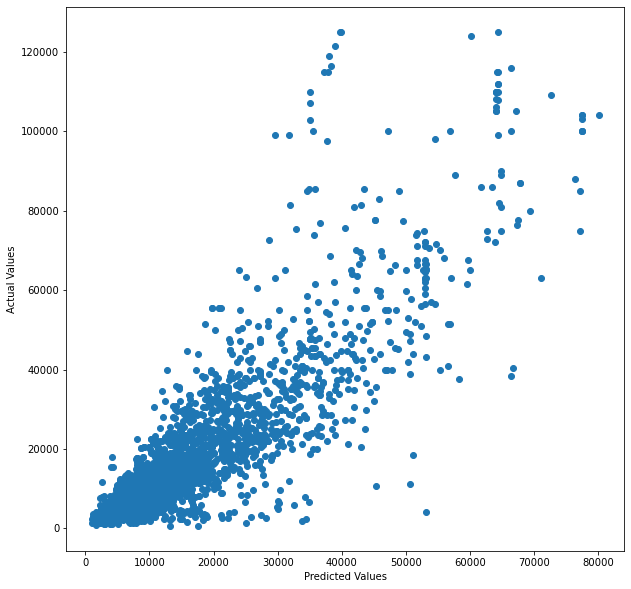

In [151]:
plt.figure(figsize = (10,10))
plt.scatter(exp_train_pred,exp_train_act)
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')

Text(0, 0.5, 'Actual Values')

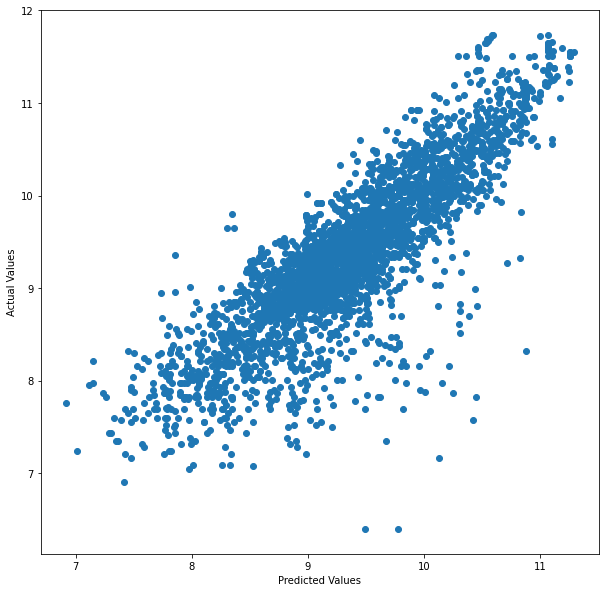

In [152]:
plt.figure(figsize = (10,10))
plt.scatter(y_hat,y_train)
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')

<AxesSubplot:xlabel='log_price', ylabel='Count'>

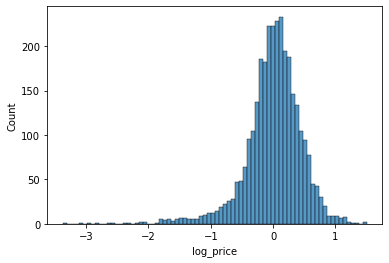

In [153]:
sns.histplot(y_train - y_hat)

In [154]:
# Caculating the R Squared
lm.score(X_train,y_train)

0.7289057327592536

In [155]:
reg_summary= pd.DataFrame(data = inputs.columns.values,columns=['Features'])
reg_summary['Weights'] = lm.coef_
reg_summary

,Features,Weights
0,Mileage,-0.466853
1,EngineV,0.217076
2,Brand_BMW,0.016217
3,Brand_Mercedes-Benz,-0.002708
4,Brand_Mitsubishi,-0.136002
5,Brand_Renault,-0.186335
6,Brand_Toyota,-0.061960
7,Brand_Volkswagen,-0.093435
8,Body_hatch,-0.152804
9,Body_other,-0.098576


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16]),
 [Text(0, 0, 'Mileage'),
  Text(1, 0, 'EngineV'),
  Text(2, 0, 'Brand_BMW'),
  Text(3, 0, 'Brand_Mercedes-Benz'),
  Text(4, 0, 'Brand_Mitsubishi'),
  Text(5, 0, 'Brand_Renault'),
  Text(6, 0, 'Brand_Toyota'),
  Text(7, 0, 'Brand_Volkswagen'),
  Text(8, 0, 'Body_hatch'),
  Text(9, 0, 'Body_other'),
  Text(10, 0, 'Body_sedan'),
  Text(11, 0, 'Body_vagon'),
  Text(12, 0, 'Body_van'),
  Text(13, 0, 'Engine Type_Gas'),
  Text(14, 0, 'Engine Type_Other'),
  Text(15, 0, 'Engine Type_Petrol'),
  Text(16, 0, 'Registration_yes')])

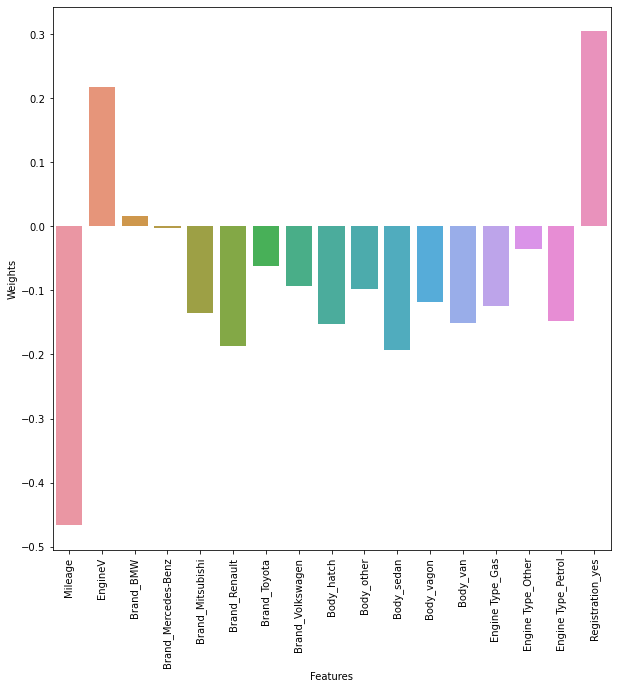

In [159]:
plt.figure(figsize = (10,10))
sns.barplot(data = reg_summary, x = 'Features', y = 'Weights')
plt.xticks(rotation = 90)